# Ensemble Sensitivity Analyses
Ty Janoski

## Setup

In [1]:
# Import statements
from typing import List, Union

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import metpy.calc as mpcalc
import numpy as np
import scienceplots  # noqa: F401
import xarray as xr
import xskillscore as xs
from metpy.calc import frontogenesis
from metpy.units import units
from scipy.ndimage import gaussian_filter

plt.style.use(["science", "nature"])
plt.rcParams["text.usetex"] = True


In [2]:
# Define useful functions
def get_wofs_all(init: int) -> xr.Dataset:
    """Read in WoFS output based on initialization time."""
    file_pattern = f"/mnt/drive2/new-wofs/{init:02d}Z/wofs_ALL*.nc"
    loaded = xr.open_mfdataset(
        file_pattern, combine="nested", concat_dim="time", chunks="auto"
    )

    if init < 6:
        start_time = f"2021-09-02 {init:02d}:00:00"
        end_time = f"2021-09-02 {init + 6:02d}:00:00"
    else:
        start_time = f"2021-09-01 {init:02d}:00:00"
        end_time = f"2021-09-02 {init - 24 + 6:02d}:00:00"

    loaded["time"] = xr.cftime_range(start_time, end_time, freq="5min")
    return loaded


def get_total_field(
    wofs_list: List[xr.Dataset],
    varname: str,
    start_time: str,
    end_time: str,
    init_dim: xr.DataArray,
) -> xr.DataArray:
    """
    Calculate the sum of a field (varname) for a given time slice across multiple datasets.

    Parameters:
    wofs_list (List[xr.Dataset]): List of xarray datasets.
    varname (str): Name of the variable from the Dataset to get.
    start_time (str): Start time for the time slice (format: 'YYYY-MM-DD HH:MM:SS').
    end_time (str): End time for the time slice (format: 'YYYY-MM-DD HH:MM:SS').
    init_dim (str): Name of the dimension to concatenate along.

    Returns:
    xr.DataArray: Summed-up variable concatenated along the specified dimension.
    """
    return xr.concat(
        [
            w[varname].sel(time=slice(start_time, end_time)).sum(dim="time")
            for w in wofs_list
        ],
        dim=init_dim,
    ).chunk({"init": -1})


def get_field(
    wofs_list: List[xr.Dataset],
    varname: str,
    start_time: str,
    end_time: str,
    init_dim: xr.DataArray,
) -> xr.DataArray:
    """
    Return a field (varname) for a given time slice across multiple datasets.

    Parameters:
    wofs_list (List[xr.Dataset]): List of xarray datasets.
    varname (str): Name of the variable from the Dataset to get.
    start_time (str): Start time for the time slice (format: 'YYYY-MM-DD HH:MM:SS').
    end_time (str): End time for the time slice (format: 'YYYY-MM-DD HH:MM:SS').
    init_dim (str): Name of the dimension to concatenate along.

    Returns:
    xr.DataArray: Summed-up variable concatenated along the specified dimension.
    """
    return xr.concat(
        [w[varname].sel(time=slice(start_time, end_time)) for w in wofs_list],
        dim=init_dim,
    ).chunk({"init": -1})


def get_smoothed_ds(
    da: xr.DataArray, sigma: Union[float, int], axes: Union[str, List[str]] = None
):
    """
    Apply a Gaussian filter to specific dimensions of an xarray.DataArray and return
    a Dataset containing both the original and smoothed data.

    Parameters:
    - da (xr.DataArray): Input data array.
    - sigma (float or int): Standard deviation for the Gaussian kernel.
    - axes (str or List[str], optional): Dimensions to smooth over. Defaults to all dimensions.

    Returns:
    - xr.Dataset: A dataset containing the original and smoothed DataArrays.
    """
    # Type checking
    if not isinstance(da, xr.DataArray):
        raise TypeError("Input must be an xarray.DataArray.")
    if not isinstance(sigma, (float, int)):
        raise TypeError("Sigma must be a float or an integer.")
    if axes is not None and not isinstance(axes, (str, list)):
        raise TypeError("Axes must be a string, a list of strings, or None.")

    # Convert a single axis string to a list
    if isinstance(axes, str):
        axes = [axes]

    # If no axes specified, apply to all dimensions
    if axes is None:
        axes = list(da.dims)

    # Convert dimension names to axis indices
    try:
        axis_indices = [da.get_axis_num(dim) for dim in axes]
    except ValueError as e:
        raise ValueError(f"Invalid axis name in {axes}: {e}")

    # Construct full sigma array where only selected axes are smoothed
    full_sigma = [sigma if i in axis_indices else 0 for i in range(da.ndim)]

    # Apply the Gaussian filter
    smoothed_data = gaussian_filter(da.values, sigma=full_sigma)

    # Create a new DataArray with the same metadata
    smoothed_da = xr.DataArray(
        smoothed_data,
        dims=da.dims,
        coords=da.coords,
        attrs={
            **da.attrs,
            "description": f"Gaussian smoothed (sigma={sigma}) over {axes}",
        },
    )

    # Combine original and smoothed data into a Dataset
    ds = xr.Dataset({"original": da, "smoothed": smoothed_da})

    return ds


In [3]:
# Load in 20-23Z initializations
wofs_all = [get_wofs_all(i) for i in [20, 21, 22, 23]]

# Define variables and parameters
lat = wofs_all[0].xlat.isel(time=0).squeeze().drop_vars("time")
lon = wofs_all[0].xlon.isel(time=0).squeeze().drop_vars("time")

# Set up Cartopy projection
proj = ccrs.LambertConformal(
    central_longitude=wofs_all[0].attrs["CEN_LON"],
    central_latitude=wofs_all[0].attrs["CEN_LAT"],
    standard_parallels=(30, 60),
)  # WoFS projection

# Create a DataArray for the initialization dimension
init = xr.DataArray(data=["20Z", "21Z", "22Z", "23Z"], dims="init").assign_coords(
    {"init": ["20Z", "21Z", "22Z", "23Z"]}
)


/tmp/ipykernel_1017128/807954958.py:16: DeprecationWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  loaded["time"] = xr.cftime_range(start_time, end_time, freq="5min")
/tmp/ipykernel_1017128/807954958.py:16: DeprecationWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  loaded["time"] = xr.cftime_range(start_time, end_time, freq="5min")
/tmp/ipykernel_1017128/807954958.py:16: DeprecationWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  loaded["time"] = xr.cftime_range(start_time, end_time, freq="5min")
/tmp/ipykernel_1017128/807954958.py:16: DeprecationWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  loaded["time"] = xr.cftime_range(start_time, end_time, freq="5min")


In [4]:
# Get the 01 to 02 UTC rainfall
rain12 = get_total_field(
    wofs_all, "rain", "2021-09-02 01:05:00", "2021-09-02 02:00:00", init_dim=init
)

# Calculate standard deviation of rainfall
std = rain12.std(dim=("init", "ne"))

# Lastly, make our area of interest where sd > 65% of max sd
aoi = std > (std.max() * 0.65)

rain12_aoi = (
    rain12.where(aoi).mean(dim=("lat", "lon"), skipna=True).stack(run=("init", "ne"))
)

# Read in front locations
front_locs = np.load("data/front_locs_hourly_23_to_01.npy")


## PW and CAPE

In [6]:
# Extract PW and CAPE
pw = get_field(
    wofs_all, "pw", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
).stack(run=("init", "ne"))[0::12, :, :, :]
cape = get_field(
    wofs_all, "cape_ml", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
).stack(run=("init", "ne"))[0::12, :, :, :]

# Smooth
pw = get_smoothed_ds(pw, sigma=3, axes=["lat", "lon"]).smoothed
cape = get_smoothed_ds(cape.where(cape > 0), sigma=3, axes=["lat", "lon"])
cape_unsmoothed = cape.original
cape = cape.smoothed

# Calculate sensitivities
pw_sens = xs.linslope(pw, rain12_aoi, dim="run") * pw.std(dim="run")
cape_sens = xs.linslope(cape, rain12_aoi, dim="run") * cape.std(dim="run")

# And p-values
pw_p = xs.pearson_r_p_value(pw, rain12_aoi, dim="run")
cape_p = xs.pearson_r_p_value(cape, rain12_aoi, dim="run")


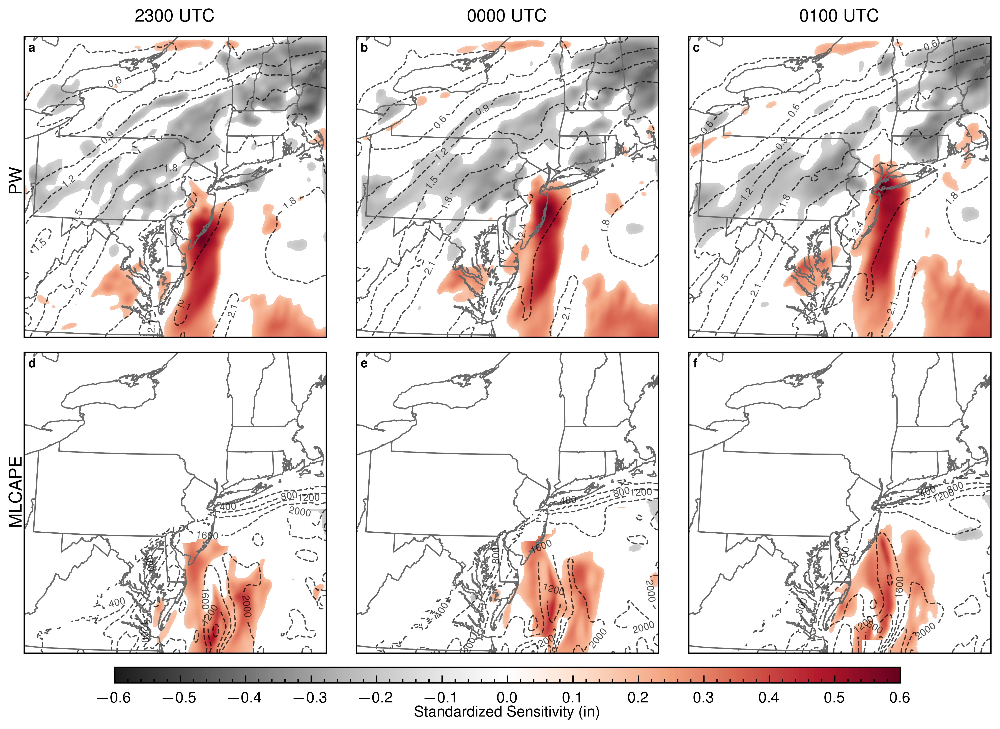

In [7]:
sensitivites = [pw_sens[i, :, :] for i in range(3)] + [
    cape_sens[i, :, :] for i in range(3)
]
pvalues = [pw_p[i, :, :] for i in range(3)] + [cape_p[i, :, :] for i in range(3)]
means = [pw[i, :, :, :].mean(dim="run") for i in range(3)] + [
    cape[i, :, :, :].mean(dim="run") * units.K / units.kilogram for i in range(3)
]

letters = ["a", "b", "c", "d", "e", "f"]
column_titles = ["2300 UTC", "0000 UTC", "0100 UTC"]

cmap = plt.get_cmap("RdGy_r")
# Create figure and subplots
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(5.5, 4),
    dpi=900,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

# Iterate through axes
for i, ax in enumerate(axes.flat):
    # Set condition from p-values
    if i <= 2:
        cond = pvalues[i] < 0.05
        levels = np.arange(0, 2.5, 0.3)
        ax.set_title(column_titles[i], fontsize=7)
    else:
        cond = (pvalues[i] < 0.05) & (cape_unsmoothed[i - 3, :, :, :].min(dim="run").values > 0)
        levels = np.arange(400, 2801, 400)

    # Plot the standardized sensitivities
    pc = ax.pcolormesh(
        lon,
        lat,
        sensitivites[i].where(cond),
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        vmin=-0.6,
        vmax=0.6,
        rasterized = True,
    )

    # Contour the ensemble means
    c = ax.contour(
        lon,
        lat,
        means[i],
        colors="k",
        transform=ccrs.PlateCarree(),
        levels=levels,
        linewidths=0.5,
        linestyles="dashed",
        alpha=0.7,
    )

    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="dimgray", zorder=2)
    ax.clabel(c, inline=True, fontsize=4)
    ax.text(
        0.015, 0.95, r"\textbf{" + letters[i] + "}", transform=ax.transAxes, fontsize=5
    )

fig.text(0.0, 0.74, "PW", rotation=90, fontsize=7)
fig.text(0.0, 0.28, "MLCAPE", rotation=90, fontsize=7)

cb = fig.colorbar(
    pc,
    ax=axes,
    orientation="horizontal",
    pad=0.02,
    aspect=50,
    shrink=0.8,
)
cb.ax.tick_params(labelsize=6)
cb.set_ticks(np.arange(-0.6, 0.7, 0.1)) # type: ignore
cb.set_label(r"Standardized Sensitivity (in)", fontsize=6, labelpad=0.01)

# plt.show()
# Save fig
plt.savefig("figures/Fig9_ESA_PW_MLCAPE.pdf",bbox_inches="tight")



## Geopotential Heights

In [8]:
# Extract geopotential heights
da_500 = get_field(
    wofs_all, "geo_hgt_500", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
).stack(run=("init", "ne"))[0::12, :, :, :]
da_850 = get_field(
    wofs_all, "geo_hgt_850", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
).stack(run=("init", "ne"))[0::12, :, :, :]

# We need to smooth, but 850mb is noisy because of high elevations
da_850 = xr.where(da_850 <= 1, np.nan, da_850).interpolate_na(
    dim="lat", method="linear"
)

# Smooth
z850 = get_smoothed_ds(da_850, sigma=3, axes=["lat", "lon"]).smoothed
z500 = get_smoothed_ds(da_500, sigma=3, axes=["lat", "lon"]).smoothed

# Calculate sensitivities
z500_sens = xs.linslope(z500, rain12_aoi, dim="run") * z500.std(dim="run")
z850_sens = xs.linslope(z850, rain12_aoi, dim="run") * z850.std(dim="run")

# And p-values
z500_p = xs.pearson_r_p_value(z500, rain12_aoi, dim="run")
z850_p = xs.pearson_r_p_value(z850, rain12_aoi, dim="run")


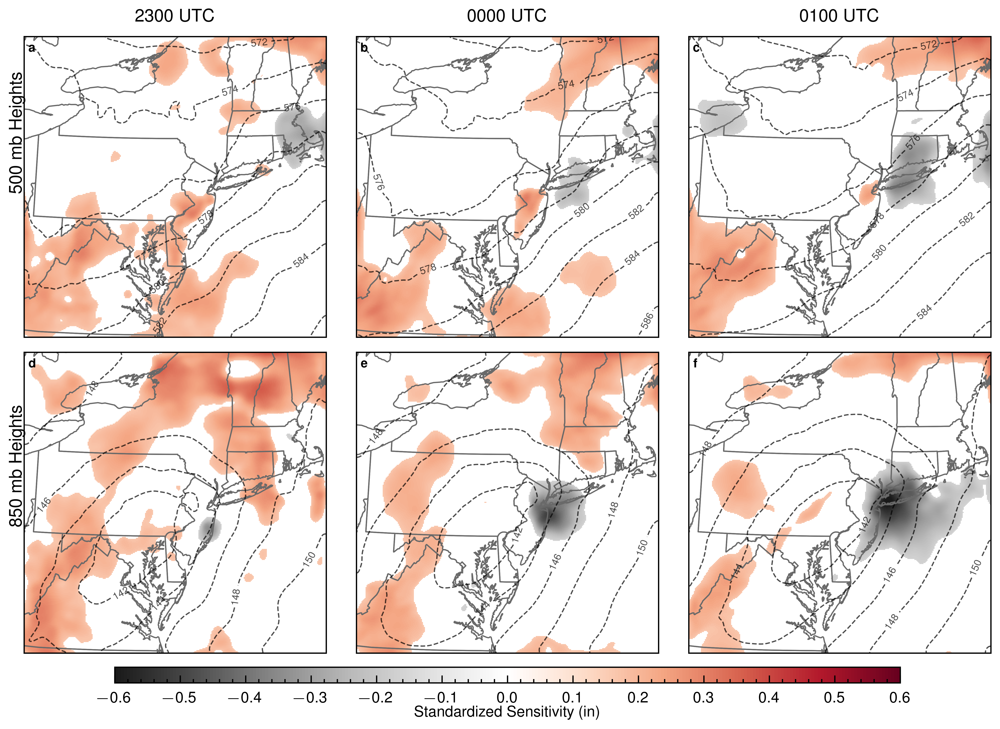

In [9]:
sensitivites = [z500_sens[i, :, :] for i in range(3)] + [
    z850_sens[i, :, :] for i in range(3)
]
pvalues = [z500_p[i, :, :] for i in range(3)] + [z850_p[i, :, :] for i in range(3)]
means = [z500[i, :, :, :].mean(dim="run") for i in range(3)] + [
    z850[i, :, :, :].mean(dim="run") for i in range(3)
]

letters = ["a", "b", "c", "d", "e", "f"]
column_titles = ["2300 UTC", "0000 UTC", "0100 UTC"]

cmap = plt.get_cmap("RdGy_r")
# Create figure and subplots
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(5.5, 4),
    dpi=900,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

# Iterate through axes
for i, ax in enumerate(axes.flat):
    # Set condition from p-values
    if i <= 2:
        cond = pvalues[i] < 0.05
        levels = range(560, 590, 2)
        ax.set_title(column_titles[i], fontsize=7)
    else:
        cond = pvalues[i] < 0.05
        levels = np.arange(140, 160, 2)

    # Plot the standardized sensitivities
    pc = ax.pcolormesh(
        lon,
        lat,
        sensitivites[i].where(cond),
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        vmin=-0.6,
        vmax=0.6,
        rasterized=True,
    )

    # Contour the ensemble means
    c = ax.contour(
        lon,
        lat,
        means[i] / 10,
        colors="k",
        transform=ccrs.PlateCarree(),
        levels=levels,
        linewidths=0.5,
        linestyles="dashed",
        alpha=0.7,
        zorder=3,
    )

    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="dimgray", zorder=2)
    ax.clabel(c, inline=True, fontsize=4)
    ax.text(
        0.015, 0.95, r"\textbf{" + letters[i] + "}", transform=ax.transAxes, fontsize=5
    )

fig.text(0.0, 0.74, "500 mb Heights", rotation=90, fontsize=7)
fig.text(0.0, 0.28, "850 mb Heights", rotation=90, fontsize=7)

cb = fig.colorbar(
    pc,
    ax=axes,
    orientation="horizontal",
    pad=0.02,
    aspect=50,
    shrink=0.8,
)
cb.ax.tick_params(labelsize=6)
cb.set_ticks(np.arange(-0.6, 0.7, 0.1)) # type: ignore
cb.set_label(r"Standardized Sensitivity (in)", fontsize=6, labelpad=0.01)

# plt.show()
# Save fig
plt.savefig("figures/FigS6_ESA_z500_z850.pdf", bbox_inches="tight")


## 850 mb Winds

In [10]:
# Extract 850 mb u- and v-winds
u850 = get_field(
    wofs_all, "U_850", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
).stack(run=("init", "ne"))[0::12, :, :, :]
v850 = get_field(
    wofs_all, "V_850", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
).stack(run=("init", "ne"))[0::12, :, :, :]
mslp = get_field(
    wofs_all, "mslp", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
).stack(run=("init", "ne"))[0::12, :, :, :]

# Smooth
u850 = get_smoothed_ds(u850, sigma=3, axes=["lat", "lon"]).smoothed
v850 = get_smoothed_ds(v850, sigma=3, axes=["lat", "lon"]).smoothed
mslp = get_smoothed_ds(mslp, sigma=3, axes=["lat", "lon"]).smoothed

# Calculate sensitivities
u850_sens = xs.linslope(u850, rain12_aoi, dim="run") * u850.std(dim="run")
v850_sens = xs.linslope(v850, rain12_aoi, dim="run") * v850.std(dim="run")

# And p-values
u850_p = xs.pearson_r_p_value(u850, rain12_aoi, dim="run")
v850_p = xs.pearson_r_p_value(v850, rain12_aoi, dim="run")

mslp_ens_mean = mslp.mean(dim="run").assign_coords(lat=mslp.lat, lon=mslp.lon)


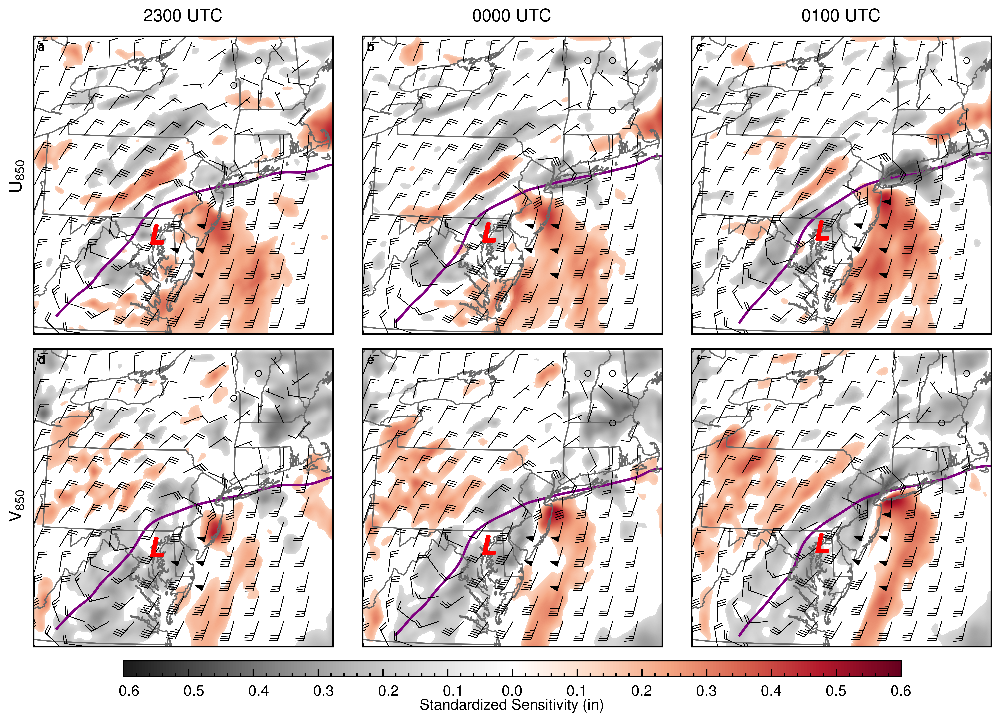

In [11]:
sensitivites = [u850_sens[i, :, :] for i in range(3)] + [
    v850_sens[i, :, :] for i in range(3)
]
pvalues = [u850_p[i, :, :] for i in range(3)] + [v850_p[i, :, :] for i in range(3)]
dx = 25  # spacing between barbs
u_means = [u850[i, ::dx, ::dx, :].mean(dim="run") for i in range(3)]
v_means = [v850[i, ::dx, ::dx, :].mean(dim="run") for i in range(3)]

letters = ["a", "b", "c", "d", "e", "f"]
column_titles = ["2300 UTC", "0000 UTC", "0100 UTC"]

cmap = plt.get_cmap("RdGy_r")
# Create figure and subplots
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(5.5, 4),
    dpi=900,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

# Iterate through axes
for i, ax in enumerate(axes.flat):
    # Set condition from p-values
    if i <= 2:
        cond = pvalues[i] < 0.10
        levels = range(560, 590, 2)
        ax.set_title(column_titles[i], fontsize=7)
    else:
        cond = pvalues[i] < 0.10
        levels = np.arange(140, 160, 2)

    # Plot the standardized sensitivities
    pc = ax.pcolormesh(
        lon,
        lat,
        sensitivites[i].where(cond),
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        vmin=-0.6,
        vmax=0.6,
        rasterized=True,
    )

    # Add wind barbs
    b = ax.barbs(
        lon[::dx, ::dx].values,
        lat[::dx, ::dx].values,
        u_means[i % 3].values,
        v_means[i % 3].values,
        transform=ccrs.PlateCarree(),
        length=4,
        linewidth=0.3,
        zorder=3,
        color="k",
    )

    # Add front locations
    cn = ax.contour(
        lon,
        lat,
        front_locs[i % 3],
        transform=ccrs.PlateCarree(),
        levels=[0],
        colors="purple",
        linewidths=1.0,
    )

    # Add dot where low pressure center is
    mslp_ens_mean_slice = mslp_ens_mean.isel(time=i % 3)
    mslp_ens_mean_min = mslp_ens_mean_slice.where(
        mslp_ens_mean_slice == mslp_ens_mean_slice.min(dim=["lat", "lon"]), drop=True
    )
    lon_point = lon[mslp_ens_mean_min.lat, mslp_ens_mean_min.lon]
    lat_point = lat[mslp_ens_mean_min.lat, mslp_ens_mean_min.lon]
    pl = ax.scatter(
        lon_point,
        lat_point,
        transform=ccrs.PlateCarree(),
        color="red",
        marker="$L$",
        s=50,
        zorder=5,
    )

    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="dimgray", zorder=2)
    # ax.clabel(c, inline=True, fontsize=4)
    ax.text(
        0.015, 0.95, r"\textbf{" + letters[i] + "}", transform=ax.transAxes, fontsize=5
    )

fig.text(-0.01, 0.74, "U$_{850}$", rotation=90, fontsize=7)
fig.text(-0.01, 0.28, "V$_{850}$", rotation=90, fontsize=7)

cb = fig.colorbar(
    pc,
    ax=axes,
    orientation="horizontal",
    pad=0.02,
    aspect=50,
    shrink=0.8,
)
cb.ax.tick_params(labelsize=6)
cb.set_ticks(np.arange(-0.6, 0.7, 0.1)) # type: ignore
cb.set_label(r"Standardized Sensitivity (in)", fontsize=6, labelpad=0.01)

# Save fig
plt.savefig("figures/Fig8_ESA_850_winds.pdf",bbox_inches="tight")


## Vorticity & Frontogenesis

In [7]:
# Get frontogenesis ingredients
t850 = (
    get_field(
        wofs_all, "temperature_850", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
    )
    .stack(run=("init", "ne"))[0::12, :, :, :]
    .transpose("time", "run", "lat", "lon")
)
u850 = (
    get_field(wofs_all, "U_850", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init)
    .stack(run=("init", "ne"))[0::12, :, :, :]
    .transpose("time", "run", "lat", "lon")
)
v850 = (
    get_field(wofs_all, "V_850", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init)
    .stack(run=("init", "ne"))[0::12, :, :, :]
    .transpose("time", "run", "lat", "lon")
)

# Smooth our fields
t850 = get_smoothed_ds(t850, sigma=9, axes=["lat", "lon"]).smoothed
u850 = get_smoothed_ds(u850, sigma=9, axes=["lat", "lon"]).smoothed
v850 = get_smoothed_ds(v850, sigma=9, axes=["lat", "lon"]).smoothed

# Calculate potential temperature
theta_850 = mpcalc.potential_temperature(850 * units.hPa, t850 * units.degree_Kelvin)

# Calculate vorticity
# We end up with units of knot / km, but it doesn't matter
# for the sensitivity analysis
vort = mpcalc.vorticity(
    u850 * units.knot,
    v850 * units.knot,
    dx=3 * units.kilometers,
    dy=3 * units.kilometers,
    x_dim=-1,
    y_dim=-2,
).metpy.convert_units("1 / s")

# Calculate frontogenesis
fg = (
    frontogenesis(
        theta_850,
        u850 * units.knot,
        v850 * units.knot,
        dx=3 * units.kilometers,
        dy=3 * units.kilometers,
        x_dim=-1,
        y_dim=-2,
    ).metpy.convert_units("K / (km * hr)")
    * 100
    * 3
)

# Calculate sensitivity and p-values for frontogenesis
fg_sens = xs.linslope(
    fg.metpy.dequantify(), rain12_aoi, dim="run"
) * fg.metpy.dequantify().std(dim="run")
fg_p = xs.pearson_r_p_value(fg.metpy.dequantify(), rain12_aoi, dim="run")

# Calculate sensitivity and p-values for vorticity
vort_sens = xs.linslope(
    vort.metpy.dequantify(), rain12_aoi, dim="run"
) * vort.metpy.dequantify().std(dim="run")
vort_p = xs.pearson_r_p_value(vort.metpy.dequantify(), rain12_aoi, dim="run")


/tmp/ipykernel_377865/1265271873.py:31: UserWarning: Horizontal dimension numbers not found. Defaulting to (..., Y, X) order.
  vort = mpcalc.vorticity(
/tmp/ipykernel_377865/1265271873.py:42: UserWarning: Horizontal dimension numbers not found. Defaulting to (..., Y, X) order.
  frontogenesis(


<>:89: SyntaxWarning: invalid escape sequence '\z'
<>:89: SyntaxWarning: invalid escape sequence '\z'
/tmp/ipykernel_377865/1416333728.py:89: SyntaxWarning: invalid escape sequence '\z'
  fig.text(-0.01, 0.74, "$\zeta_{850}$", rotation=90, fontsize=8)


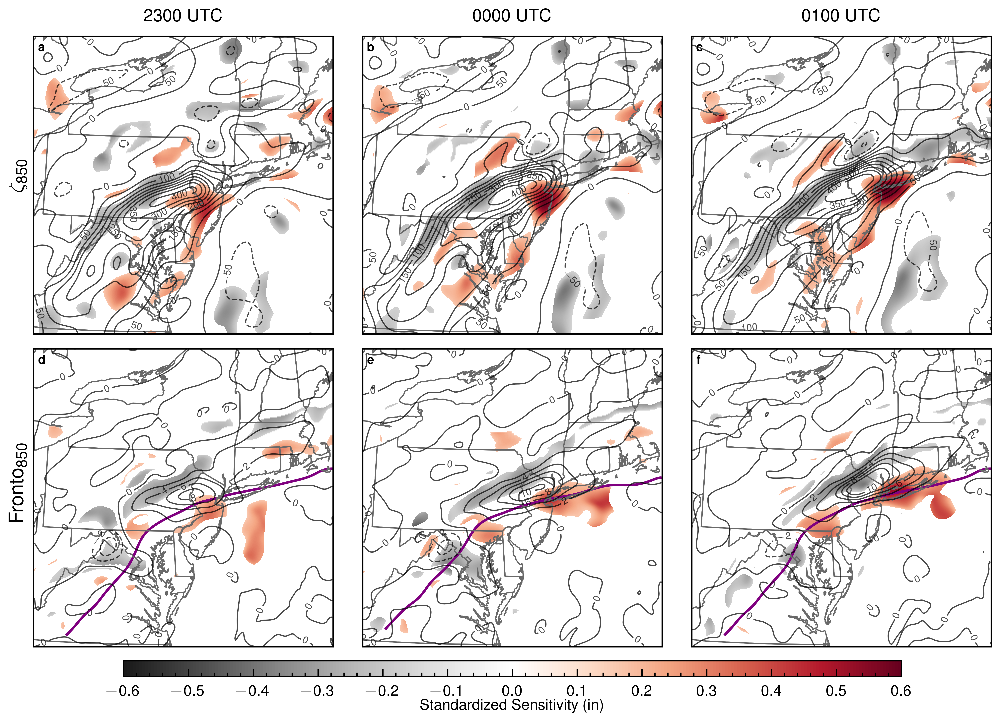

In [15]:
linewidths = 0.5
sensitivites = [vort_sens[i, :, :] for i in range(3)] + [
    fg_sens[i, :, :] for i in range(3)
]
pvalues = [vort_p[i, :, :].metpy.dequantify() for i in range(3)] + [
    fg_p[i, :, :].metpy.dequantify() for i in range(3)
]
means = [
    vort[i, :, :, :].mean(dim="run").metpy.dequantify() * 1e6 for i in range(3)
] + [fg[i, :, :, :].mean(dim="run").metpy.dequantify() for i in range(3)]
levels = [np.arange(-400,401,50),np.arange(-10, 11, 2)]

titles = ["2300 UTC", "0000 UTC", "0100 UTC"]
letters = ["a", "b", "c", "d", "e", "f"]
cmap = plt.get_cmap("RdGy_r")

# Create figure and subplots
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(5.5, 4),
    dpi=900,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

# Iterate through axes
for i, ax in enumerate(axes.flat):
    if(i<=2):
        cond = (pvalues[i] < 0.05) & (abs(means[i]) > 30)
        ax.set_title(titles[i], fontsize=7)
    else:
        cond = (pvalues[i] < 0.05) & (abs(means[i]) > 0.5)

    # Plot the standardized sensitivities
    pc = ax.pcolormesh(
        lon,
        lat,
        sensitivites[i].where(cond),
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        vmin=-0.6,
        vmax=0.6,
        rasterized=True,
    )

    # Contour the ensemble means
    c = ax.contour(
        lon,
        lat,
        means[i],
        colors="k",
        transform=ccrs.PlateCarree(),
        levels=levels[i//3],
        linewidths=0.5,
        alpha=0.7,
        zorder=3,
    )

    if(i>= 3):
        cn = ax.contour(
            lon,
            lat,
            front_locs[i%2],
            transform=ccrs.PlateCarree(),
            levels=[0],
            colors="purple",
            linewidths=1.0,
        )

    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="dimgray", zorder=2)
    ax.clabel(c, inline=True, fontsize=4)
    ax.text(
        0.015, 0.95, r"\textbf{" + letters[i] + "}", transform=ax.transAxes, fontsize=5
    )

cb = fig.colorbar(
    pc,
    ax=axes,
    orientation="horizontal",
    pad=0.02,
    aspect=50,
    shrink=0.8,
)
cb.ax.tick_params(labelsize=6)
cb.set_ticks(np.arange(-0.6, 0.7, 0.1))  # type: ignore
cb.set_label(r"Standardized Sensitivity (in)", fontsize=6, labelpad=0.01)

fig.text(-0.01, 0.74, "$\zeta_{850}$", rotation=90, fontsize=8)
fig.text(-0.01, 0.28, "Fronto$_{850}$", rotation=90, fontsize=8)

# Save fig
plt.savefig("figures/FigS2_ESA_vort_front.pdf", bbox_inches="tight")
plt.show()


## Meridional Moisture Flux Convergence

In [5]:
# Read in 850 mb v-wind and specific humidity
v850 = (
    get_field(wofs_all, "V_850", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init)
    .stack(run=("init", "ne"))[0::12, :, :, :]
    .transpose("time", "run", "lat", "lon")
)
q850 = (
    get_field(
        wofs_all, "QVAPOR_850", "2021-09-01 23:00:00", "2021-09-02 01:00:00", init
    )
    .stack(run=("init", "ne"))[0::12, :, :, :]
    .transpose("time", "run", "lat", "lon")
)

# Smooth (sigma=9)
v850_smoothed = get_smoothed_ds(v850, sigma=9, axes=["lat", "lon"]).smoothed
q850_smoothed = get_smoothed_ds(q850, sigma=9, axes=["lat", "lon"]).smoothed

# Calculate meridional moisture flux convergence
q = q850_smoothed * units.dimensionless
v = (v850_smoothed * units.knot).metpy.convert_units("mps")
dqdy = (q.differentiate("lat") * (3/units.km)).metpy.convert_units("1/m")
dvdy = (v.differentiate("lat") * (3/units.km)).metpy.convert_units("1/s")

mmfc = (-q * dvdy + -v * dqdy)

# Calculate sensitivity and p-values
mmfc_sens = xs.linslope(mmfc, rain12_aoi, dim="run") * mmfc.std(dim="run")
mmfc_p = xs.pearson_r_p_value(mmfc, rain12_aoi, dim="run")

/home/janoski/miniforge3/envs/wof/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1585: UserWarning: The following kwargs were not used by contour: 'rasterized'
  result = super().contour(*args, **kwargs)
/home/janoski/miniforge3/envs/wof/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1585: UserWarning: The following kwargs were not used by contour: 'rasterized'
  result = super().contour(*args, **kwargs)
/home/janoski/miniforge3/envs/wof/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1585: UserWarning: The following kwargs were not used by contour: 'rasterized'
  result = super().contour(*args, **kwargs)
/home/janoski/miniforge3/envs/wof/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1585: UserWarning: The following kwargs were not used by contour: 'rasterized'
  result = super().contour(*args, **kwargs)
/home/janoski/miniforge3/envs/wof/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1585: UserWarning: The following kwargs were not used by contour: 'rasterized'

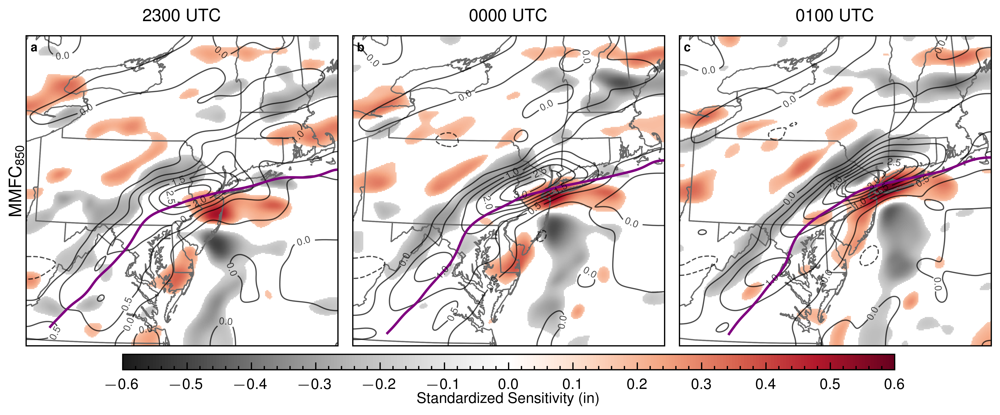

In [6]:
linewidths = 0.5
sensitivites = [mmfc_sens[i, :, :] for i in range(3)]
pvalues = [mmfc_p[i, :, :].metpy.dequantify() for i in range(3)]
means = [mmfc[i, :, :, :].mean(dim="run") for i in range(3)]
levels = np.arange(-0.5,3.01,0.5)

titles = ["2300 UTC", "0000 UTC", "0100 UTC"]
letters = ["a", "b", "c"]
cmap = plt.get_cmap("RdGy_r")

# Create figure and subplots
fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(5.5, 2.5),
    dpi=900,
    layout="constrained",
    subplot_kw=dict(projection=proj),
)

# Iterate through axes
for i, ax in enumerate(axes.flat):
    cond = (pvalues[i] < 0.05)

    # Plot the standardized sensitivities
    pc = ax.pcolormesh(
        lon,
        lat,
        sensitivites[i].where(cond),
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        vmin=-0.6,
        vmax=0.6,
        rasterized=True,
    )

    # Contour the ensemble means
    c = ax.contour(
        lon,
        lat,
        means[i] * 1e5,
        colors="k",
        transform=ccrs.PlateCarree(),
        levels=levels,
        linewidths=0.5,
        alpha=0.7,
        zorder=3,
    )

    cn = ax.contour(
        lon,
        lat,
        front_locs[i],
        transform=ccrs.PlateCarree(),
        levels=[0],
        colors="purple",
        linewidths=1.0,
        zorder=4,
        rasterized=True,
    )

    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor="dimgray", zorder=2)
    ax.clabel(c, inline=True, fontsize=4)
    ax.text(
        0.015, 0.95, r"\textbf{" + letters[i] + "}", transform=ax.transAxes, fontsize=5
    )
    ax.set_title(titles[i], fontsize=7)

cb = fig.colorbar(
    pc,
    ax=axes,
    orientation="horizontal",
    pad=0.02,
    aspect=50,
    shrink=0.8,
)
cb.ax.tick_params(labelsize=6)
cb.set_ticks(np.arange(-0.6, 0.7, 0.1))
cb.set_label(r"Standardized Sensitivity (in)", fontsize=6, labelpad=0.01)

fig.text(-0.01, 0.45, "MMFC$_{850}$", rotation=90, fontsize=7)

plt.savefig("figures/FigS4_ESA_MMFC_850.pdf", bbox_inches="tight")
plt.show()